In [3]:
import xarray as xr
import hvplot.xarray
import geopandas as gpd
import hvplot.pandas
import matplotlib.pyplot as plt
from trollimage.xrimage import XRImage
def stretch_dataarray(x:xr.DataArray, stretch='histogram') -> xr.DataArray:
    '''perform a trollimage stretch operation with given method
    stretch is applied in-place and the enhancement attribute is updated'''
     
    xrimage = XRImage(x)
    
    xrimage.stretch(stretch=stretch)

    return xrimage.data

In [4]:
outfiles = !find /users/rsg/anla/scratch/network/21_02_shiptracks/results_batched/2010 -name "*.nc"

In [58]:
outfiles[4]

'/users/rsg/anla/scratch/network/21_02_shiptracks/results_batched/2010/01/01/A2010001073000_day_microphysics_inferred_ship_tracks.nc'

In [15]:
ds = xr.open_dataarray(outfiles[4])

In [47]:
import cartopy.crs as ccrs


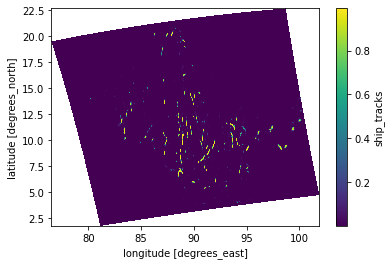

In [51]:
ds.plot(x='longitude',y='latitude')

In [57]:
ds

<xarray.DataArray 'ship_tracks' (x: 1354, y: 2030)>
[2748620 values with dtype=float32]
Coordinates:
    longitude  (y, x) float64 ...
    latitude   (y, x) float64 ...
Dimensions without coordinates: x, y
Attributes:
    description:  inferred ship track array

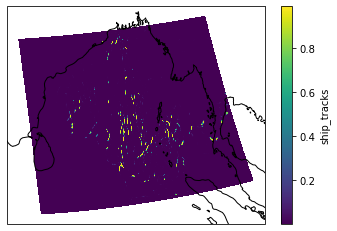

In [56]:
map_proj = ccrs.LambertConformal(central_longitude=90, central_latitude=12)


p = ds.plot(x='longitude',y='latitude',
       transform=ccrs.PlateCarree(),
       subplot_kws={'projection': map_proj})

p.axes.coastlines()

/users/rsg/anla/anaconda3/envs/geospatial/lib/python3.9/site-packages/geopandas/geodataframe.py:577: RuntimeWarning: Sequential read of iterator was interrupted. Resetting iterator. This can negatively impact the performance.
  for feature in features_lst:


ValueError: cannot use subplot_kws with existing ax

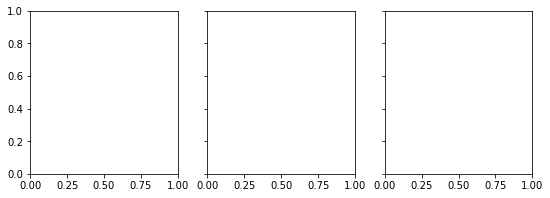

In [66]:
for (raw, infered, geometry) in list(zip(sorted(infiles), sorted(outfiles), sorted(outgpkg)))[1:3]:
    
    ds = xr.open_dataarray(raw)
    
    enhanced = stretch_dataarray(ds)
    
    inferred = xr.open_dataarray(infered)
    
    gdf = gpd.read_file(geometry)
    gdf = gdf[gdf['coords']=='geographic']
    
    # plotting
    map_proj = ccrs.LambertConformal(central_longitude=90, central_latitude=12)
    
    fig, ax = plt.subplots(1,3, sharey=True, figsize=(9,3))
    
#     p = ds.plot(x='longitude',y='latitude',
#            transform=ccrs.PlateCarree(),
#            subplot_kws={'projection': map_proj},
#                ax=ax[0])

#     p.axes.coastlines()
    

    
    p = enhanced.sel(bands='R').plot(x='longitude',y='latitude',
           transform=ccrs.PlateCarree(),
           subplot_kws={'projection': map_proj},
               ax=ax[1])

    p.axes.coastlines()

In [60]:
outgpkg = !find /users/rsg/anla/scratch/network/21_02_shiptracks/results/from_mageo/2010 -name "*.gpkg"

In [61]:
infiles = !find /users/rsg/anla/scratch/network/21_02_shiptracks/data/from_mageo/2010 -name "*.nc"

In [62]:
for (raw, infered, geometry) in list(zip(sorted(infiles), sorted(outfiles), sorted(outgpkg)))[1:3]:
    
    ds = xr.open_dataarray(raw)
    
    enhanced = stretch_dataarray(ds)
    e = enhanced
    e = e.assign_coords({dim:range(e[dim].size) for dim in e.dims})
    
    inferred = xr.open_dataarray(infered)
    
    gdf = gpd.read_file(geometry)
    gdf = gdf[gdf['coords']=='swath']
    
    (inferred.drop(inferred.coords).hvplot(kind='quadmesh',rasterize=True) * \
     gdf[gdf['coords']=='swath'].hvplot(color='red', alpha=0.5) + \
    e.T.hvplot.rgb(x='y',y='x')).cols(1) * \
    gdf[gdf['coords']=='swath'].hvplot(color='red', alpha=0.5)

/users/rsg/anla/anaconda3/envs/geospatial/lib/python3.9/site-packages/geopandas/geodataframe.py:577: RuntimeWarning: Sequential read of iterator was interrupted. Resetting iterator. This can negatively impact the performance.
  for feature in features_lst:
/users/rsg/anla/anaconda3/envs/geospatial/lib/python3.9/site-packages/xarray/core/dataarray.py:2264: FutureWarning: dropping coordinates using `drop` is be deprecated; use drop_vars.
  ds = self._to_temp_dataset().drop(labels, dim, errors=errors)
/users/rsg/anla/anaconda3/envs/geospatial/lib/python3.9/site-packages/geopandas/geodataframe.py:577: RuntimeWarning: Sequential read of iterator was interrupted. Resetting iterator. This can negatively impact the performance.
  for feature in features_lst:
/users/rsg/anla/anaconda3/envs/geospatial/lib/python3.9/site-packages/xarray/core/dataarray.py:2264: FutureWarning: dropping coordinates using `drop` is be deprecated; use drop_vars.
  ds = self._to_temp_dataset().drop(labels, dim, errors=

In [63]:
(inferred.drop(inferred.coords).hvplot(kind='quadmesh',rasterize=True) * \
 gdf[gdf['coords']=='swath'].hvplot(color='red', alpha=0.5) + \
e.T.hvplot.rgb(x='y',y='x') * \
gdf[gdf['coords']=='swath'].hvplot(line_color='blue', color='none', alpha=1)).cols(1)

/users/rsg/anla/anaconda3/envs/geospatial/lib/python3.9/site-packages/xarray/core/dataarray.py:2264: FutureWarning: dropping coordinates using `drop` is be deprecated; use drop_vars.
  ds = self._to_temp_dataset().drop(labels, dim, errors=errors)
/users/rsg/anla/anaconda3/envs/geospatial/lib/python3.9/site-packages/numba/np/ufunc/parallel.py:365: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9107. The TBB threading layer is disabled.
  warnings.warn(problem)


:Layout
   .DynamicMap.I :DynamicMap   []
      :Overlay
         .Image.I    :Image   [y,x]   (ship_tracks)
         .Polygons.I :Polygons   [x,y]
   .Overlay.I    :Overlay
      .RGB.I      :RGB   [y,x]   (R,G,B)
      .Polygons.I :Polygons   [x,y]